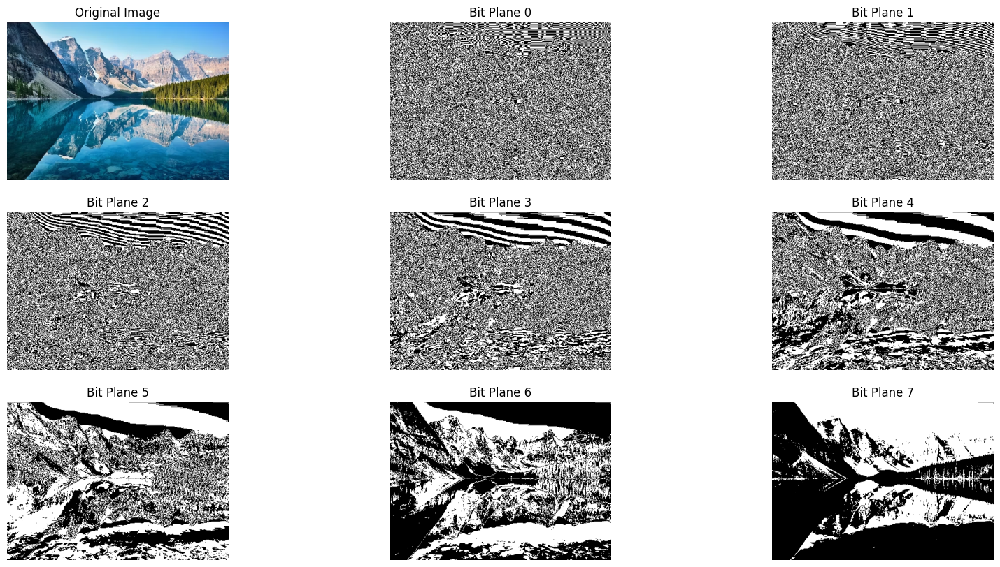

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def bit_plane_slice(image):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    bit_planes = {}
    for i in range(8):
        mask = 1 << i
        bit_plane = np.bitwise_and(gray_image, mask)
        bit_plane = (bit_plane / 255) * 255
        bit_planes[f'Bit Plane {i}'] = bit_plane.astype(np.uint8)
    return bit_planes

image_path = '/content/image1.jpg'
image = cv2.imread(image_path)

if image is None:
    print("Error: Image not loaded.")
else:
    bit_planes = bit_plane_slice(image)
    plt.figure(figsize=(20, 10))
    plt.subplot(3, 3, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')

    for i, (title, bit_plane) in enumerate(bit_planes.items(), start=2):
        plt.subplot(3, 3, i)
        plt.imshow(bit_plane, cmap='gray')
        plt.title(title)
        plt.axis('off')

    plt.show()


In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def bit_plane_slice(image):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    bit_planes = {}
    for i in range(8):
        mask = 1 << i
        bit_plane = np.bitwise_and(gray_image, mask)
        bit_plane = (bit_plane / 255) * 255
        bit_planes[f'Bit Plane {i}'] = bit_plane.astype(np.uint8)
    return bit_planes

def filter_image(bit_planes):
    combined_image = np.zeros_like(list(bit_planes.values())[0])
    for i in range(7, -1, -1):
        combined_image = (combined_image << 1) | bit_planes[f'Bit Plane {i}']
    return combined_image

image_path = '/content/image3.jpg'
image = cv2.imread(image_path)

if image is None:
    print("Error: Image not loaded.")
else:
    noisy_image = cv2.add(image, np.random.normal(5, 5, image.shape), dtype=cv2.CV_8UC3)
    noisy_bit_planes = bit_plane_slice(noisy_image)
    filtered_image = filter_image(noisy_bit_planes)

    plt.figure(figsize=(20, 15))

    plt.subplot(3, 3, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(3, 3, 2)
    plt.imshow(cv2.cvtColor(noisy_image, cv2.COLOR_BGR2RGB))
    plt.title('Noisy Image')
    plt.axis('off')

    for i, (title, bit_plane) in enumerate(noisy_bit_planes.items(), start=3):
        plt.subplot(3, 3, i)
        plt.imshow(bit_plane, cmap='gray')
        plt.title(title)
        plt.axis('off')

    plt.subplot(3, 3, 9)
    plt.imshow(filtered_image, cmap='gray')
    plt.title('Filtered Image')
    plt.axis('off')

    plt.show()


Output hidden; open in https://colab.research.google.com to view.

Saving 4. question noisy noisy free.png to 4. question noisy noisy free (6).png


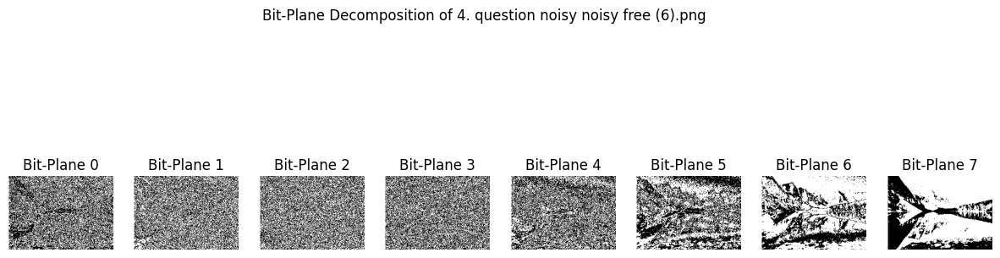

In [ ]:
import cv2
import numpy as np
from google.colab import files
import matplotlib.pyplot as plt

def is_noisy(image_path, threshold=10000):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    variance = np.var(image)

    if variance > threshold:
        return True
    else:
        return False

def decompose_bit_planes(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    bit_planes = [np.bitwise_and(image, 2**i) for i in range(8)]

    return bit_planes

uploaded = files.upload()

image_paths = list(uploaded.keys())

non_noisy_images = [image_path for image_path in image_paths if not is_noisy(image_path)]

for image_path in non_noisy_images:
    bit_planes = decompose_bit_planes(image_path)

    plt.figure(figsize=(15, 5))
    for i, plane in enumerate(bit_planes):
        plt.subplot(1, 8, i + 1)
        plt.imshow(plane, cmap='gray')
        plt.title(f"Bit-Plane {i}")
        plt.axis('off')

    plt.suptitle(f"Bit-Plane Decomposition of {image_path}")
    plt.show()


In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from google.colab import files

def is_noisy(image_path, threshold=100):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    variance = np.var(image)

    if variance > threshold:
        return True
    else:
        return False

def bit_plane_slice(image):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    bit_planes = {}

    for i in range(8):
        mask = 1 << i
        bit_plane = np.bitwise_and(gray_image, mask)
        bit_plane = (bit_plane / 255) * 255
        bit_planes[f'Bit Plane {i}'] = bit_plane.astype(np.uint8)

    return bit_planes

def filter_image(bit_planes):
    combined_image = np.zeros_like(list(bit_planes.values())[0])

    for i in range(7, -1, -1):  # Iterate from 7 to 0
        combined_image = (combined_image << 1) | bit_planes[f'Bit Plane {i}']

    return combined_image

uploaded = files.upload()

image_paths = list(uploaded.keys())

clean_image_paths = [image_path for image_path in image_paths if not is_noisy(image_path)]

for image_path in clean_image_paths:
    image = cv2.imread(image_path)

    if image is None:
        print(f"Error: Image {image_path} not loaded.")
        continue

    bit_planes = bit_plane_slice(image)

    filtered_image = filter_image(bit_planes)

    plt.figure(figsize=(20, 15))

    plt.subplot(3, 3, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')

    for i, (title, bit_plane) in enumerate(bit_planes.items(), start=2):
        plt.subplot(3, 3, i)
        plt.imshow(bit_plane, cmap='gray')
        plt.title(title)
        plt.axis('off')

    plt.subplot(3, 3, 9)
    plt.imshow(filtered_image, cmap='gray')
    plt.title('Filtered Image')
    plt.axis('off')

    plt.show()


Saving image1.jpg to image1 (2).jpg


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def decompose_image_into_bit_planes(image_path):
    c = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if c is None:
        print(f"Error: Could not read image {image_path}")
        return

    cd = np.array(c, dtype=np.uint8)

    c1 = np.bitwise_and(cd, 1)
    c2 = np.bitwise_and(np.right_shift(cd, 1), 1)
    c3 = np.bitwise_and(np.right_shift(cd, 2), 1)
    c4 = np.bitwise_and(np.right_shift(cd, 3), 1)
    c5 = np.bitwise_and(np.right_shift(cd, 4), 1)
    c6 = np.bitwise_and(np.right_shift(cd, 5), 1)
    c7 = np.bitwise_and(np.right_shift(cd, 6), 1)
    c8 = np.bitwise_and(np.right_shift(cd, 7), 1)

    filtered_c1 = cv2.medianBlur(c1.astype(np.uint8) * 255, 3) // 255
    filtered_c2 = cv2.medianBlur(c2.astype(np.uint8) * 255, 3) // 255
    filtered_c3 = cv2.medianBlur(c3.astype(np.uint8) * 255, 3) // 255
    filtered_c4 = cv2.medianBlur(c4.astype(np.uint8) * 255, 3) // 255
    filtered_c5 = cv2.medianBlur(c5.astype(np.uint8) * 255, 3) // 255
    filtered_c6 = cv2.medianBlur(c6.astype(np.uint8) * 255, 3) // 255
    filtered_c7 = cv2.medianBlur(c7.astype(np.uint8) * 255, 3) // 255
    filtered_c8 = cv2.medianBlur(c8.astype(np.uint8) * 255, 3) // 255

    cc = np.uint8(
        filtered_c8 * 128 + filtered_c7 * 64 + filtered_c6 * 32 + filtered_c5 * 16 +
        filtered_c4 * 8 + filtered_c3 * 4 + filtered_c2 * 2 + filtered_c1
    )

    plt.figure(figsize=(30, 15))

    plt.subplot(2, 5, 1)
    plt.imshow(c, cmap="gray")
    plt.title("Original Image")

    plt.subplot(2, 5, 2)
    plt.imshow(c1, cmap="gray")
    plt.title("Bit Plane 1")

    plt.subplot(2, 5, 3)
    plt.imshow(c2, cmap="gray")
    plt.title("Bit Plane 2")

    plt.subplot(2, 5, 4)
    plt.imshow(c3, cmap="gray")
    plt.title("Bit Plane 3")

    plt.subplot(2, 5, 5)
    plt.imshow(c4, cmap="gray")
    plt.title("Bit Plane 4")

    plt.subplot(2, 5, 6)
    plt.imshow(c5, cmap="gray")
    plt.title("Bit Plane 5")

    plt.subplot(2, 5, 7)
    plt.imshow(c6, cmap="gray")
    plt.title("Bit Plane 6")

    plt.subplot(2, 5, 8)
    plt.imshow(c7, cmap="gray")
    plt.title("Bit Plane 7")

    plt.subplot(2, 5, 9)
    plt.imshow(c8, cmap="gray")
    plt.title("Bit Plane 8")

    plt.subplot(2, 5, 10)
    plt.imshow(cc, cmap="gray")
    plt.title("Denoised Image")

    plt.show()

image_paths = ["/content/image1 SP 0.1 - 0.1.jpg", "/content/image2 SP 0.1 - 0.1.jpg", "/content/image3 SP 0.1 - 0.1.jpg"]

for idx, image_path in enumerate(image_paths, start=1):
    print(f"Processing image {idx}: {image_path}")
    decompose_image_into_bit_planes(image_path)


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

cap = cv2.VideoCapture('/content/Time laps video ten seconds of trees in wind.mp4')

if not cap.isOpened():
    print("Error: Could not open the video file")
    exit()

ret, prev_frame = cap.read()

if not ret:
    print("Error: Could not read the first frame from the video file")
    exit()

prev_frame = cv2.cvtColor(prev_frame, cv2.COLOR_BGR2GRAY)

while True:
    ret, frame = cap.read()

    if not ret:
        break

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    diff = cv2.absdiff(gray, prev_frame)

    _, thresh = cv2.threshold(diff, 30, 255, cv2.THRESH_BINARY)

    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    for contour in contours:
        if cv2.contourArea(contour) > 1000:
            x, y, w, h = cv2.boundingRect(contour)
            cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 0), 2)

    cv2_imshow(frame)

    prev_frame = gray.copy()

    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
cap.release()


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

video_path = '/content/Time laps video ten seconds of trees in wind.mp4'
cap = cv2.VideoCapture(video_path)

if not cap.isOpened():
    print("Error: Could not open the video file")
    exit()

ret, prev_frame = cap.read()

if not ret:
    print("Error: Could not read the first frame from the video file")
    exit()

prev_frame = cv2.cvtColor(prev_frame, cv2.COLOR_BGR2GRAY)

while True:
    ret, frame = cap.read()

    if not ret:
        break

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    diff = cv2.absdiff(gray, prev_frame)

    _, thresh = cv2.threshold(diff, 30, 255, cv2.THRESH_BINARY)

    contours, _ = cv2.findContours(thresh, cv2.R
    for contour in contours:
        if cv2.contourArea(contour) > 1000:
            x, y, w, h = cv2.boundingRect(contour)
            cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 0), 2)

    cv2_imshow(frame)

    prev_frame = gray.copy()

    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()


Output hidden; open in https://colab.research.google.com to view.

Processing image 1: image1.jpg


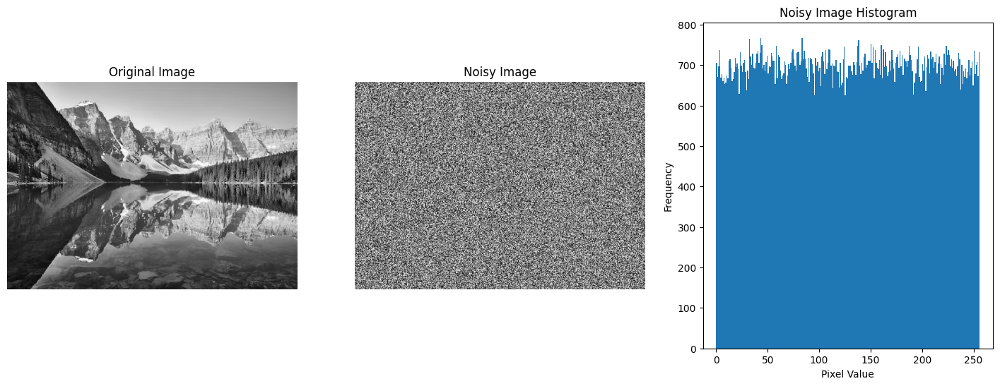

Processing image 2: image2.jpg


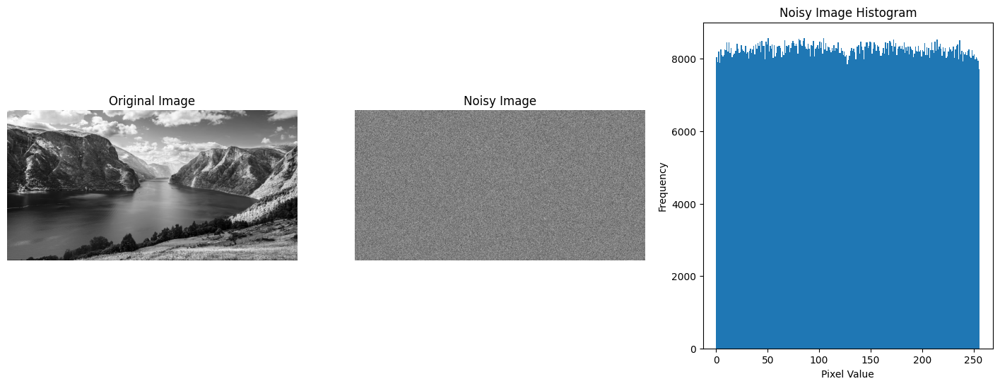

Processing image 3: image3.jpg


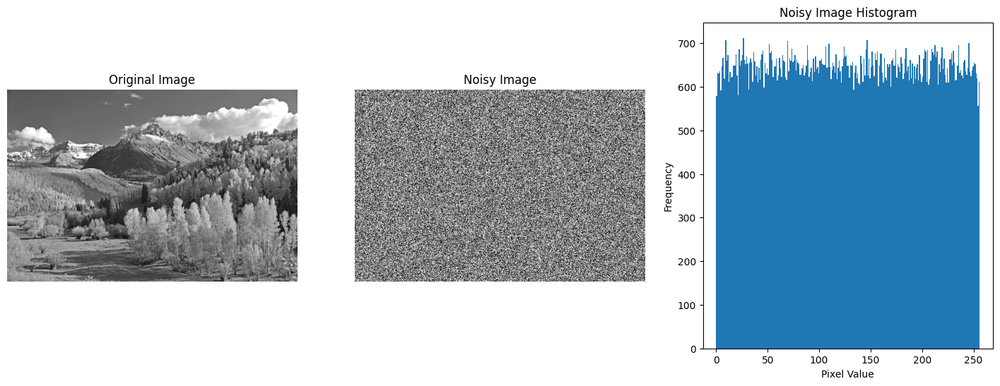

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def decompose_image_into_bit_planes(image_path):
    c = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    cd = np.array(c, dtype=np.uint8)

    c1 = np.bitwise_and(cd, 1)
    c2 = np.bitwise_and(np.right_shift(cd, 1), 1)
    c3 = np.bitwise_and(np.right_shift(cd, 2), 1)
    c4 = np.bitwise_and(np.right_shift(cd, 3), 1)
    c5 = np.bitwise_and(np.right_shift(cd, 4), 1)
    c6 = np.bitwise_and(np.right_shift(cd, 5), 1)
    c7 = np.bitwise_and(np.right_shift(cd, 6), 1)
    c8 = np.bitwise_and(np.right_shift(cd, 7), 1)

    noise_intensity = 50
    noisy_c1 = np.clip(c1 + noise_intensity * np.random.randn(*c1.shape), 0, 1)
    noisy_c2 = np.clip(c2 + noise_intensity * np.random.randn(*c2.shape), 0, 1)
    noisy_c3 = np.clip(c3 + noise_intensity * np.random.randn(*c3.shape), 0, 1)
    noisy_c4 = np.clip(c4 + noise_intensity * np.random.randn(*c4.shape), 0, 1)
    noisy_c5 = np.clip(c5 + noise_intensity * np.random.randn(*c5.shape), 0, 1)
    noisy_c6 = np.clip(c6 + noise_intensity * np.random.randn(*c6.shape), 0, 1)
    noisy_c7 = np.clip(c7 + noise_intensity * np.random.randn(*c7.shape), 0, 1)
    noisy_c8 = np.clip(c8 + noise_intensity * np.random.randn(*c8.shape), 0, 1)

    noisy_cc = np.uint8(
        noisy_c8 * 128 + noisy_c7 * 64 + noisy_c6 * 32 + noisy_c5 * 16 + noisy_c4 * 8 + noisy_c3 * 4 + noisy_c2 * 2 + noisy_c1
    )

    plt.figure(figsize=(18, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(c, cmap="gray")
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(noisy_cc, cmap="gray")
    plt.title("Noisy Image")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.hist(noisy_cc.ravel(), bins=256, range=[0,256])
    plt.title('Noisy Image Histogram')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')

    plt.show()

image_paths = ["image1.jpg", "image2.jpg", "image3.jpg"]

for idx, image_path in enumerate(image_paths, start=1):
    print(f"Processing image {idx}: {image_path}")
    decompose_image_into_bit_planes(image_path)


Processing image 1: image1.jpg


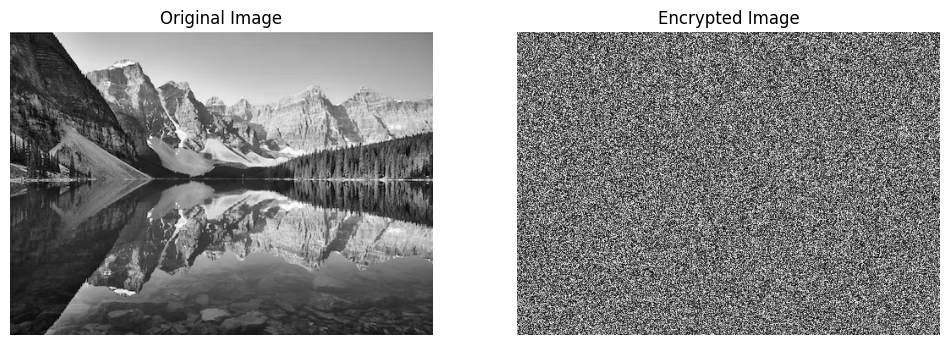

Processing image 2: image2.jpg


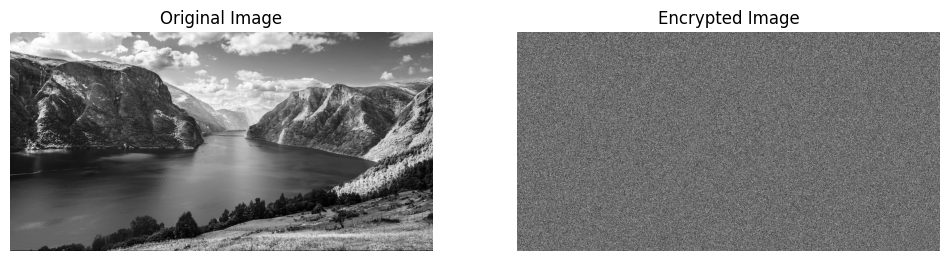

Processing image 3: image3.jpg


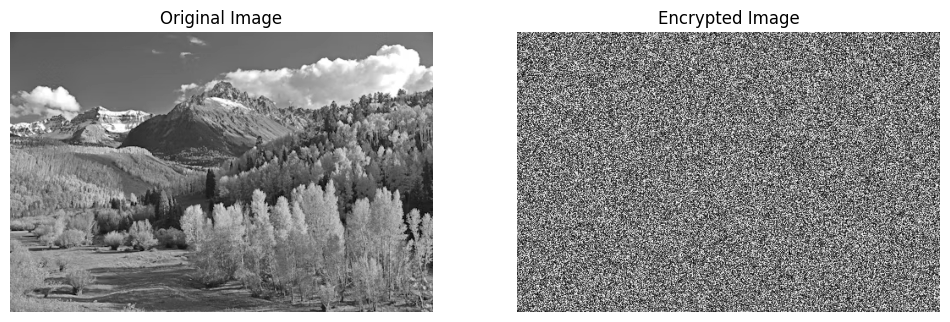

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random

def decompose_image_into_bit_planes(image_path):
    c = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    cd = np.array(c, dtype=np.uint8)

    c1 = np.bitwise_and(cd, 1)
    c2 = np.bitwise_and(np.right_shift(cd, 1), 1)
    c3 = np.bitwise_and(np.right_shift(cd, 2), 1)
    c4 = np.bitwise_and(np.right_shift(cd, 3), 1)
    c5 = np.bitwise_and(np.right_shift(cd, 4), 1)
    c6 = np.bitwise_and(np.right_shift(cd, 5), 1)
    c7 = np.bitwise_and(np.right_shift(cd, 6), 1)
    c8 = np.bitwise_and(np.right_shift(cd, 7), 1)

    return c1, c2, c3, c4, c5, c6, c7, c8

def shuffle_bit_planes(bit_planes):
    shuffled_planes = []

    for plane in bit_planes:
        flat_plane = plane.flatten()
        shuffled_indices = np.random.permutation(flat_plane.size)
        shuffled_plane = flat_plane[shuffled_indices]
        shuffled_plane = np.reshape(shuffled_plane, plane.shape)
        shuffled_planes.append(shuffled_plane)

    return shuffled_planes

def merge_bit_planes(shuffled_planes):
    encrypted_image = np.uint8(
        shuffled_planes[7] * 128 + shuffled_planes[6] * 64 + shuffled_planes[5] * 32 +
        shuffled_planes[4] * 16 + shuffled_planes[3] * 8 + shuffled_planes[2] * 4 +
        shuffled_planes[1] * 2 + shuffled_planes[0]
    )

    return encrypted_image

image_paths = ["image1.jpg", "image2.jpg", "image3.jpg"]

for idx, image_path in enumerate(image_paths, start=1):
    print(f"Processing image {idx}: {image_path}")

    bit_planes = decompose_image_into_bit_planes(image_path)

    shuffled_planes = shuffle_bit_planes(bit_planes)

    encrypted_image = merge_bit_planes(shuffled_planes)

    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(cv2.imread(image_path, cv2.IMREAD_GRAYSCALE), cmap="gray")
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(encrypted_image, cmap="gray")
    plt.title("Encrypted Image")
    plt.axis('off')

    plt.show()

    cv2.imwrite(f"encrypted_image{idx}.jpg", encrypted_image)

Original image shape: (358, 500)


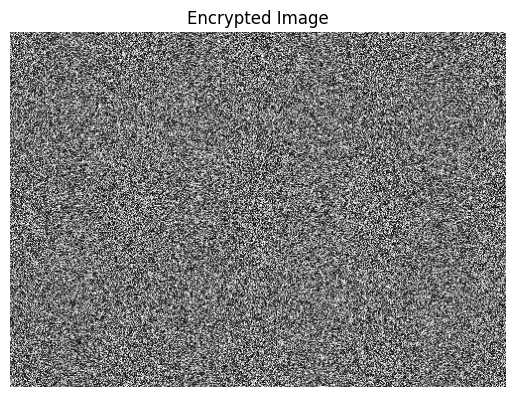

True

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random

def decompose_image_into_bit_planes(image_path, bit_planes):
    c = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    if c is None:
        raise ValueError("Image not read correctly. Please check the image path.")

    print(f"Original image shape: {c.shape}")
    cd = np.array(c, dtype=np.uint8)

    planes = [np.bitwise_and(np.right_shift(cd, i), 1) for i in bit_planes]

    return planes

def shuffle_bit_planes(bit_planes):
    if bit_planes is None:
        raise ValueError("Bit planes not provided. Please check the decomposition function.")

    shuffled_planes = []

    for plane in bit_planes:
        flat_plane = plane.flatten()
        random.shuffle(flat_plane)
        shuffled_plane = np.reshape(flat_plane, plane.shape)
        shuffled_planes.append(shuffled_plane)

    return shuffled_planes

def merge_bit_planes(shuffled_planes):
    if shuffled_planes is None:
        raise ValueError("Shuffled bit planes not provided. Please check the shuffling function.")

    encrypted_image = np.uint8(
        shuffled_planes[7] * 128 + shuffled_planes[6] * 64 + shuffled_planes[5] * 32 +
        shuffled_planes[4] * 16 + shuffled_planes[3] * 8 + shuffled_planes[2] * 4 +
        shuffled_planes[1] * 2 + shuffled_planes[0]
    )

    return encrypted_image

image_path = "image1.jpg"
bit_planes = [0, 1, 2, 3, 4, 5, 6, 7]

try:
    bit_planes_list = decompose_image_into_bit_planes(image_path, bit_planes)
except ValueError as e:
    print(e)
    exit()

try:
    shuffled_planes = shuffle_bit_planes(bit_planes_list)
except ValueError as e:
    print(e)
    exit()

try:
    encrypted_image = merge_bit_planes(shuffled_planes)
except ValueError as e:
    print(e)
    exit()

plt.imshow(encrypted_image, cmap='gray')
plt.title("Encrypted Image")
plt.axis('off')
plt.show()

cv2.imwrite("encrypted_image.jpg", encrypted_image)

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random

def decompose_image_into_bit_planes(image_path):
    c = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    if c is None:
        raise ValueError("Image not read correctly. Please check the image path.")

    print(f"Original image shape: {c.shape}")

    cd = np.array(c, dtype=np.uint8)

    c1 = np.bitwise_and(cd, 1)
    c2 = np.bitwise_and(np.right_shift(cd, 1), 1)
    c3 = np.bitwise_and(np.right_shift(cd, 2), 1)
    c4 = np.bitwise_and(np.right_shift(cd, 3), 1)
    c5 = np.bitwise_and(np.right_shift(cd, 4), 1)
    c6 = np.bitwise_and(np.right_shift(cd, 5), 1)
    c7 = np.bitwise_and(np.right_shift(cd, 6), 1)
    c8 = np.bitwise_and(np.right_shift(cd, 7), 1)

    return c1, c2, c3, c4, c5, c6, c7, c8

image_path = "/content/image3 SP 0.1 - 0.1.jpg"

try:
    bit_planes = decompose_image_into_bit_planes(image_path)
except ValueError as e:
    print(e)
    exit()

titles = ["Bit Plane 0", "Bit Plane 1", "Bit Plane 2", "Bit Plane 3",
          "Bit Plane 4", "Bit Plane 5", "Bit Plane 6", "Bit Plane 7"]

for i in range(8):
    plt.figure(figsize=(5, 5))
    plt.imshow(bit_planes[i], cmap='gray')
    plt.title(titles[i])
    plt.axis('off')
    plt.show()

def shuffle_bit_planes(bit_planes):
    if bit_planes is None:
        raise ValueError("Bit planes not provided. Please check the decomposition function.")

    shuffled_planes = []

    for plane in bit_planes:
        flat_plane = plane.flatten()
        random.shuffle(flat_plane)
        shuffled_plane = np.reshape(flat_plane, plane.shape)
        shuffled_planes.append(shuffled_plane)

    return shuffled_planes

def merge_bit_planes(shuffled_planes):
    if shuffled_planes is None:
        raise ValueError("Shuffled bit planes not provided. Please check the shuffling function.")

    encrypted_image = np.uint8(
        shuffled_planes[7] * 128 + shuffled_planes[6] * 64 + shuffled_planes[5] * 32 +
        shuffled_planes[4] * 16 + shuffled_planes[3] * 8 + shuffled_planes[2] * 4 +
        shuffled_planes[1] * 2 + shuffled_planes[0]
    )

    return encrypted_image

try:
    shuffled_planes = shuffle_bit_planes(bit_planes)
except ValueError as e:
    print(e)
    exit()

try:
    encrypted_image = merge_bit_planes(shuffled_planes)
except ValueError as e:
    print(e)
    exit()

plt.imshow(encrypted_image, cmap='gray')
plt.title("Encrypted Image")
plt.axis('off')
plt.show()

cv2.imwrite("encrypted_image.jpg", encrypted_image)


Output hidden; open in https://colab.research.google.com to view.

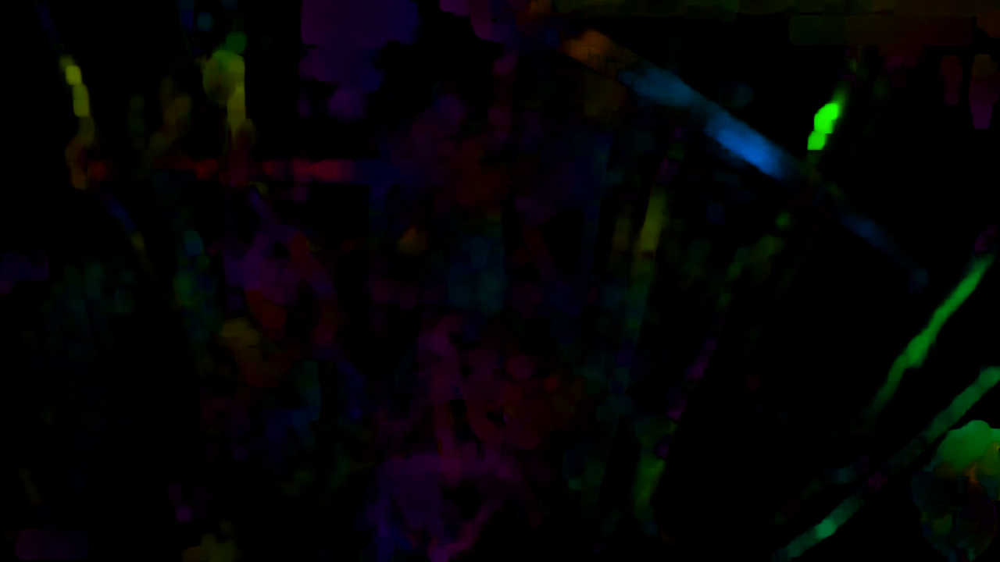

In [ ]:
from google.colab.patches import cv2_imshow
import numpy as np
import cv2

def convert_to_gray(frames):
    gray_frames = [cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY) for frame in frames]
    return gray_frames

def get_optical_flow_estimation(frame1, frame2):
    flow = cv2.calcOpticalFlowFarneback(frame1, frame2, None, 0.5, 3, 15, 3, 5, 1.2, 0)
    return flow

def filtering(result_optical_flow):
    return result_optical_flow

frame1 = cv2.imread('/content/asd2.jpg')
frame2 = cv2.imread('/content/asd1.png')

gray_frame1 = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)
gray_frame2 = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)

result_optical_flow = get_optical_flow_estimation(gray_frame1, gray_frame2)

filtered_result = filtering(result_optical_flow)

hsv = np.zeros_like(frame1)
hsv[..., 1] = 255

magnitude, angle = cv2.cartToPolar(result_optical_flow[..., 0], result_optical_flow[..., 1])
hsv[..., 0] = angle * 180 / np.pi / 2
hsv[..., 2] = cv2.normalize(magnitude, None, 0, 255, cv2.NORM_MINMAX)
filtered_result_rgb = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)

cv2_imshow(filtered_result_rgb)
cv2.waitKey(0)
cv2.destroyAllWindows()


Processing image1.jpg...


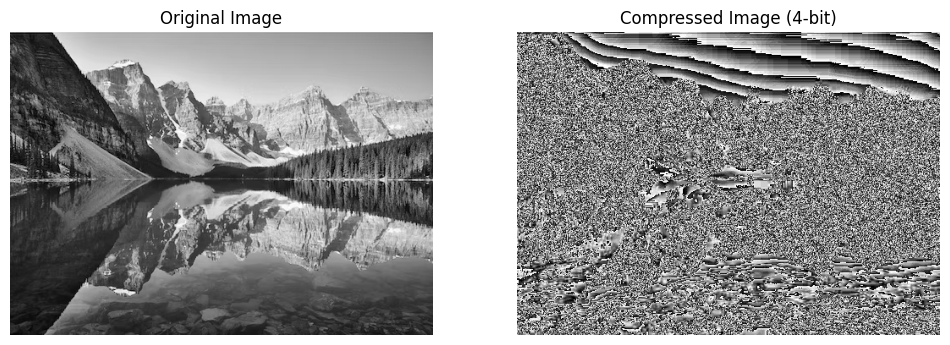

Processing image2.jpg...


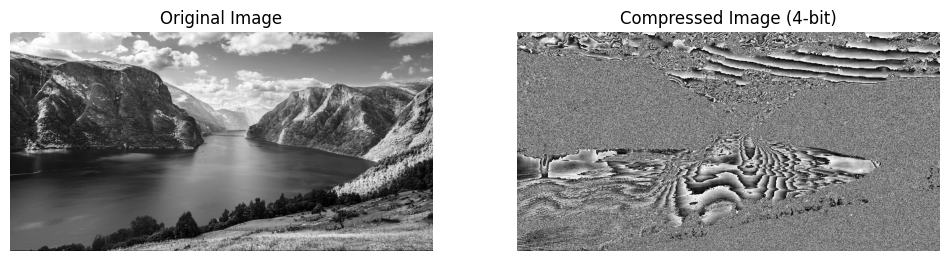

Processing image3.jpg...


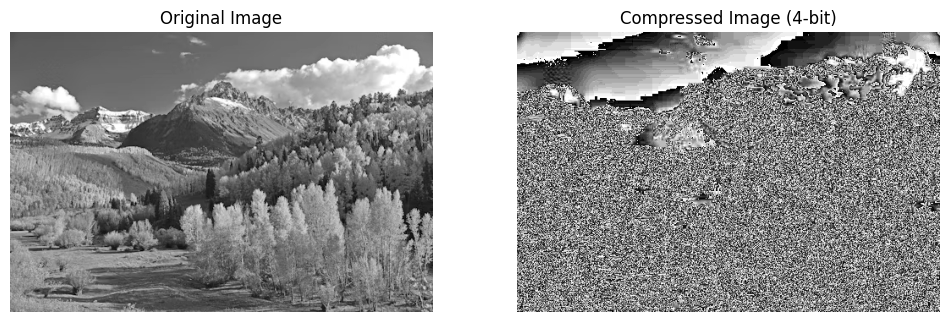

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def bit_plane_slice(image, bit_plane):
    return (image >> bit_plane) & 1

def reconstruct_image(bit_planes):
    reconstructed_image = np.zeros_like(bit_planes[0])
    for i, bit_plane in enumerate(bit_planes):
        reconstructed_image |= (bit_plane << i)
    return reconstructed_image

def compress_image(image_path, num_planes=8):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    if image is None:
        print(f"Error: Could not open {image_path}.")
        return

    image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX)

    image = image.astype(np.uint8)

    bit_planes = []

    for i in range(num_planes):
        bit_plane = bit_plane_slice(image, i)
        bit_planes.append(bit_plane)

    reconstructed_image = reconstruct_image(bit_planes[:4])

    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.title("Original Image")
    plt.imshow(image, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title("Compressed Image (4-bit)")
    plt.imshow(reconstructed_image, cmap='gray')
    plt.axis('off')

    plt.show()

image_filenames = ['image1.jpg', 'image2.jpg', 'image3.jpg']

for image_filename in image_filenames:
    image_path = image_filename
    print(f"Processing {image_filename}...")
    compress_image(image_path)


Processing image1.jpg...


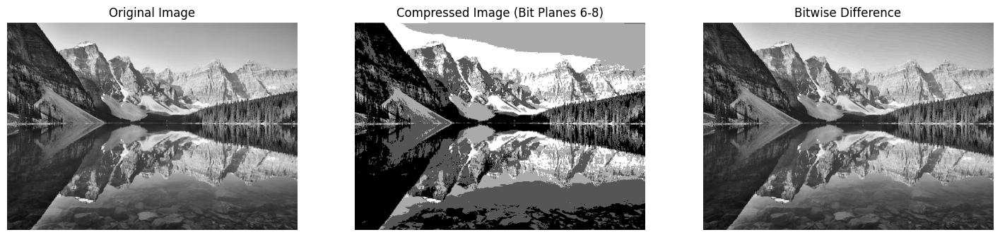

Processing image2.jpg...


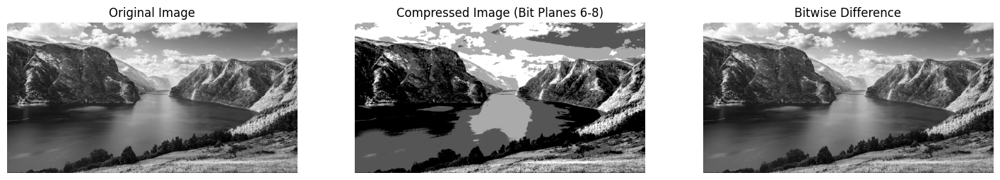

Processing image3.jpg...


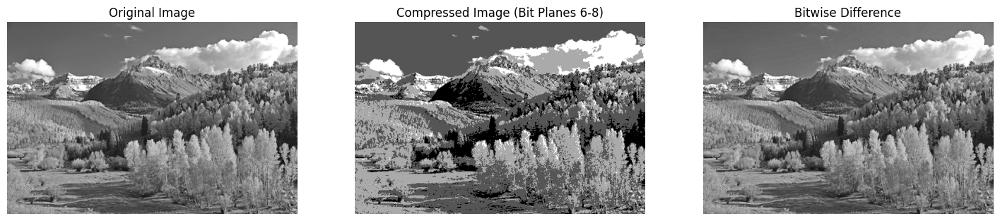

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def bit_plane_slice(image, bit_plane):
    return (image >> bit_plane) & 1

def reconstruct_image(bit_planes):
    reconstructed_image = np.zeros_like(bit_planes[0])
    for i, bit_plane in enumerate(bit_planes):
        reconstructed_image |= (bit_plane << i)
    return reconstructed_image

def compute_bitwise_difference(image1, image2):
    return cv2.bitwise_xor(image1, image2)

def compress_image(image_path, start_plane=6, end_plane=8):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    if image is None:
        print(f"Error: Could not open {image_path}.")
        return

    image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX)

    image = image.astype(np.uint8)

    bit_planes = []

    for i in range(start_plane, end_plane + 1):
        bit_plane = bit_plane_slice(image, i)
        bit_planes.append(bit_plane)

    reconstructed_image = reconstruct_image(bit_planes)

    bitwise_difference = compute_bitwise_difference(image, reconstructed_image)

    plt.figure(figsize=(18, 6))

    plt.subplot(1, 3, 1)
    plt.title("Original Image")
    plt.imshow(image, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title(f"Compressed Image (Bit Planes {start_plane}-{end_plane})")
    plt.imshow(reconstructed_image, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title("Bitwise Difference")
    plt.imshow(bitwise_difference, cmap='gray')
    plt.axis('off')

    plt.show()

image_filenames = ['image1.jpg', 'image2.jpg', 'image3.jpg']

for image_filename in image_filenames:
    image_path = image_filename
    print(f"Processing {image_filename}...")
    compress_image(image_path)


Processing image1.jpg...


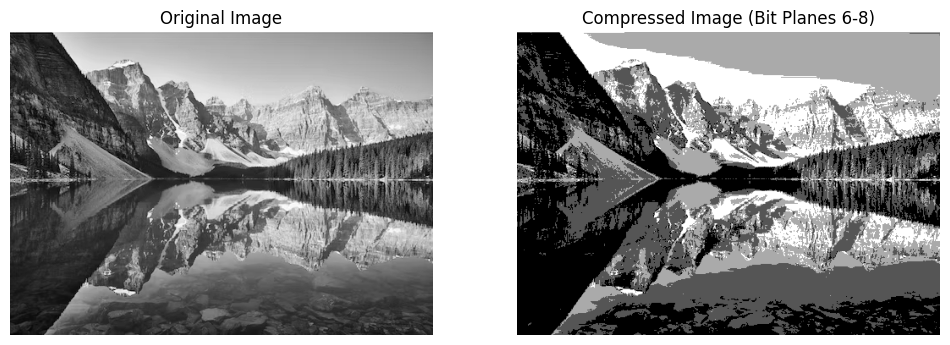

Processing image2.jpg...


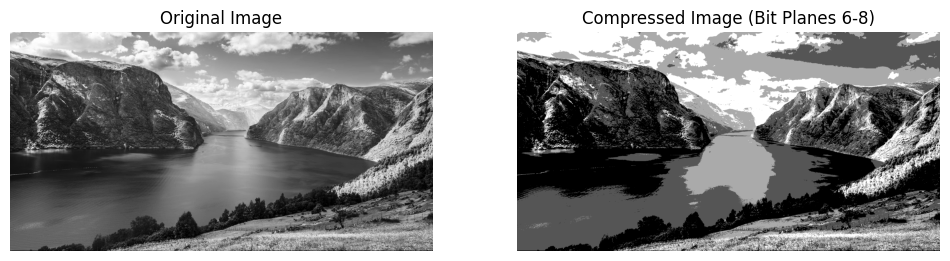

Processing image3.jpg...


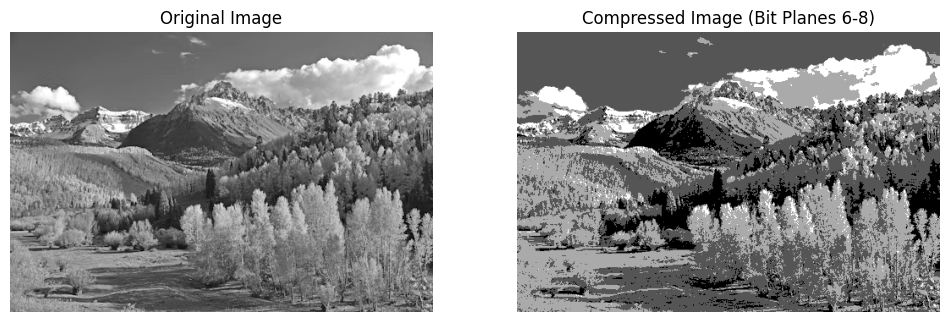

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def bit_plane_slice(image, bit_plane):
    return (image >> bit_plane) & 1

def reconstruct_image(bit_planes):
    reconstructed_image = np.zeros_like(bit_planes[0])
    for i, bit_plane in enumerate(bit_planes):
        reconstructed_image |= (bit_plane << i)
    return reconstructed_image

def compress_image(image_path, start_plane=6, end_plane=8):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    if image is None:
        print(f"Error: Could not open {image_path}.")
        return

    image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX)
    image = image.astype(np.uint8)

    bit_planes = []
    for i in range(start_plane, end_plane + 1):
        bit_plane = bit_plane_slice(image, i)
        bit_planes.append(bit_plane)

    reconstructed_image = reconstruct_image(bit_planes)
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.title("Original Image")
    plt.imshow(image, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title(f"Compressed Image (Bit Planes {start_plane}-{end_plane})")
    plt.imshow(reconstructed_image, cmap='gray')
    plt.axis('off')

    plt.show()

image_filenames = ['image1.jpg', 'image2.jpg', 'image3.jpg']

for image_filename in image_filenames:
    image_path = image_filename
    print(f"Processing {image_filename}...")
    compress_image(image_path)


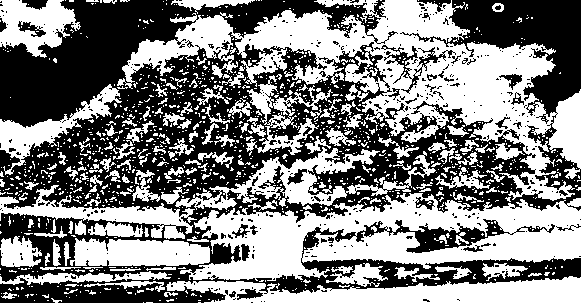

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

first_image_path = '/content/trees33.png'
second_image_path = '/content/trees44.png'

image1 = cv2.imread(first_image_path)
image2 = cv2.imread(second_image_path)

if image1 is None or image2 is None:
    print("Error reading images from the specified paths.")
    exit()

gray1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

if gray1.shape != gray2.shape:
    print("Error: Grayscale images have different dimensions.")
    exit()

motion_detected = np.zeros_like(gray1)

diff = cv2.absdiff(gray1, gray2)

bit_planes = [(diff >> i) % 2 for i in range(8)]

motion = np.zeros_like(gray1)
for i, plane in enumerate(bit_planes):
    motion |= (plane * 2**i)

_, motion_thresh = cv2.threshold(motion, 25, 255, cv2.THRESH_BINARY)

motion_detected = cv2.bitwise_or(motion_detected, motion_thresh)

cv2_imshow(motion_detected)

cv2.destroyAllWindows()


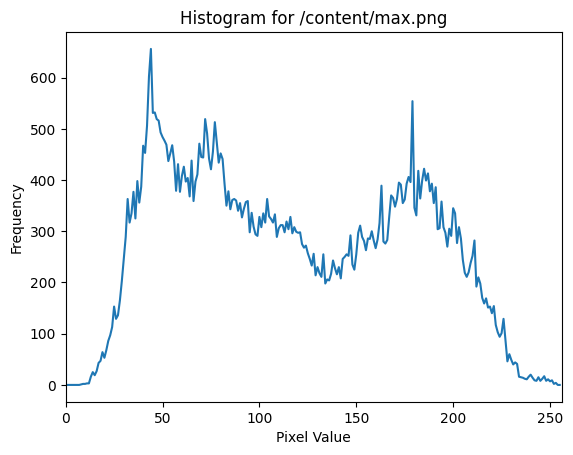

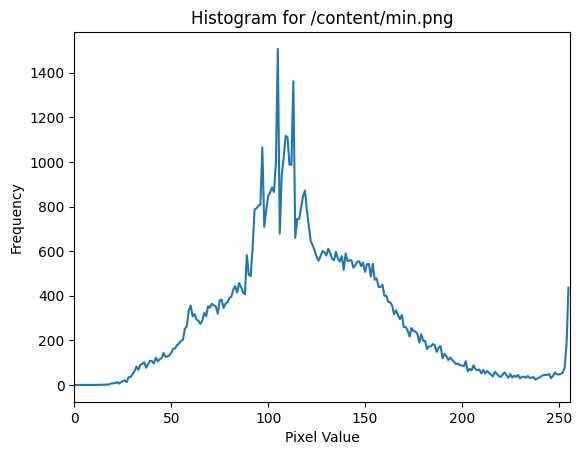

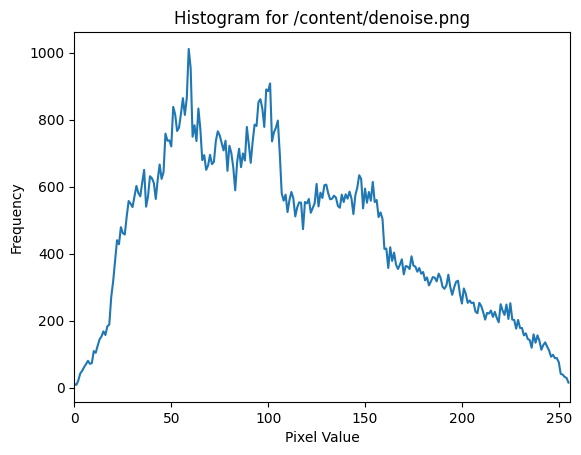

In [ ]:
import cv2
import matplotlib.pyplot as plt

def plot_histogram(image_path):
    image = cv2.imread(image_path, 0)

    hist = cv2.calcHist([image], [0], None, [256], [0, 256])

    plt.figure()
    plt.title(f'Histogram for {image_path}')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.plot(hist)
    plt.xlim([0, 256])
    plt.show()

image_paths = ['/content/max.png', '/content/min.png', '/content/denoise.png']

for path in image_paths:
    plot_histogram(path)
